In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os
import time
import datetime
import random
import torch
import torch.nn as nn
from scipy.ndimage import gaussian_filter
from scipy.optimize import minimize, Bounds
import deepwave
from tqdm.notebook import tqdm

import numpy as np
import matplotlib.pyplot as plt
import yaml

from deepinvhessian import fwi_born, fwi_lbfgs

import warnings
warnings.filterwarnings('ignore')

In [2]:
# https://github.com/swag-kaust/Transform2022_SelfSupervisedDenoising/blob/main/tutorial_utils.py
def set_seed(seed):
    """
    Use this to set ALL the random seeds to a fixed value and take out any randomness from cuda kernels
    
    Parameters
    ----------
    seed: int 
        Integer to be used for the seed
    """
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.enabled = False

    return True

set_seed(14)

True

In [3]:
# https://stackoverflow.com/questions/48152674/how-do-i-check-if-pytorch-is-using-the-gpu
# setting device on GPU if available, else CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

#Additional Info when using cuda
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))
    print('Memory Usage:')
    print('Allocated:', round(torch.cuda.memory_allocated(0)/1024**3,1), 'GB')
    print('Cached:   ', round(torch.cuda.memory_reserved(0)/1024**3,1), 'GB')

Using device: cuda
NVIDIA GeForce RTX 3090
Memory Usage:
Allocated: 0.0 GB
Cached:    0.0 GB


In [4]:
# Define the model and acquisition parameters
dict_file = "exp1"

par = {

        # model parameters
        'nx':500,   'dx':5.,        'ox':0,
        'nz':251,   'dz':5.,        'oz':0,
        'nr':250,   'dr':10,       'orec':0,  'rz':0,
        'ns':25,    'ds':100,       'osou':50,  'sz':0,
        'nt':500,   'dt':0.004,     'ot':0,

        # Inversion parameters
        'FWI_itr': 10, 'num_dims':2,
        'batch_size':1,
        'fwi_pass': 1,   # This is a count in case the code stopped and you want to resume 
        'freq' : 5,       # Dominant frequency


       # Input files 
        'vel_true': '../data/SEAM_Vp_Elastic_N23900_chop.bin',
        'init_file':None,
   
         
        # Output files
         'opfile': f'v_{dict_file}',
         'grad'  :  f'gr_{dict_file}',
         'objective': f'loss_{dict_file}',

        # others parameters 
        'vel_true_path':'',
        'output_path':'./output/',
        'comment':'<ANY ADDITIONAL COMMENT YOU LIKE TO ADD FOR THE SPECIFIC EXPERIMENT>'

    }

# For specific offset length:
# par['mxoffset']= 6 
# par['nr'] = int((2 * par['mxoffset'])//(par['dr'])) + 1  
# par['orec'] = par['osou'] - par['mxoffset']



num_sources_per_shot=1    
fs = 1/par['dt'] # sampling frequency

 
par ['num_batches'] = par['ns']//par ['batch_size'] 

par['vel_path']  =   f"{par['output_path']}velocity/"
par['loss_path'] =   f"{par['output_path']}loss/"
par['gr_path']   =   f"{par['output_path']}grad/"

 
# declare all the par in local variables
for k in par:
    locals()[k] = par[k]


#  create folders 
if not os.path.exists(output_path):
    os.makedirs(output_path)
if not os.path.exists(vel_path):
    os.makedirs(vel_path)
if not os.path.exists(loss_path):
    os.makedirs(loss_path)
if not os.path.exists(gr_path):
    os.makedirs(gr_path)
      

# Save the parametrs of this experiment (P.S. I save the parameter in the vel_path which is the main output)
with open(f'{vel_path}{dict_file}.yml', 'w') as outfile:
    yaml.dump(par, outfile, default_flow_style=False)

In [5]:
# ----------------------- input files ---------------------------------

Fvel =  par['vel_true_path'] +   par['vel_true']

# ----------------------- output files ---------------------------------

# output
Finv  = vel_path + par['opfile']
Fgr=    gr_path + par['grad']
Floss = loss_path + par['objective']

# ============================================================================
    
# Load the true model
model_true = (np.fromfile(Fvel, np.float32).reshape(nx, nz))
model_true = np.transpose(model_true)

Text(0.5, 1.0, 'True Model')

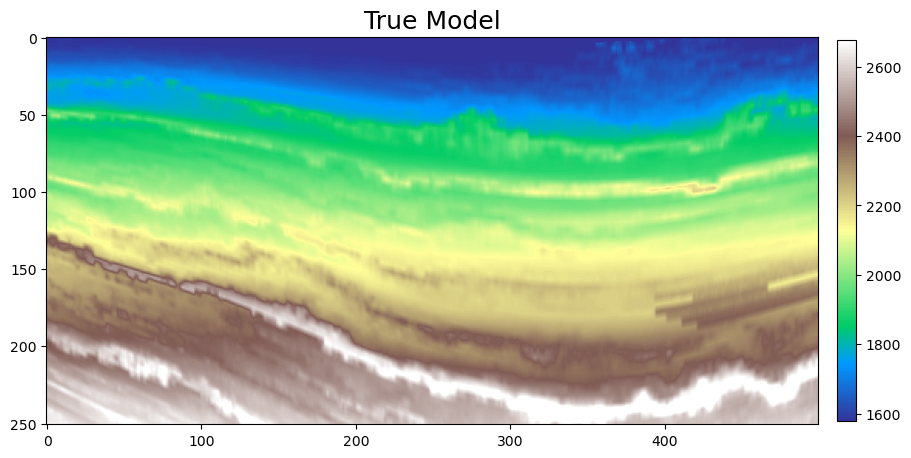

In [6]:
plt.figure(figsize=(12,8))
dm_vmin, dm_vmax = np.percentile(model_true, [2,98])
plt.imshow(model_true, vmin=dm_vmin, vmax=dm_vmax, cmap='terrain')
plt.colorbar(shrink=0.62, pad=0.02)
plt.title('True Model', fontsize=18)

In [7]:
model_true = torch.tensor(model_true, dtype=torch.float32)
# initiate the fwi class
params = fwi_born.FWIParams(par, acquisition=1)
# Create the source wavelet
wavel = fwi_born.Ricker(params).repeat(1,ns,1)
# Compute the true data
data_true = fwi_born.forward_modelling(params, model_true, wavel, device).cpu()

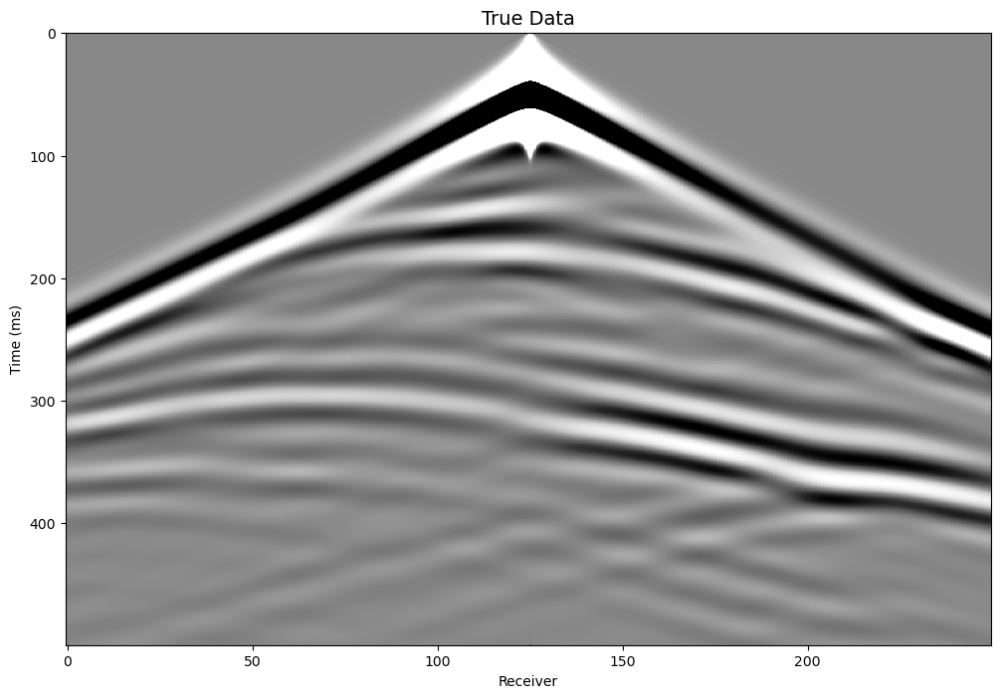

In [8]:
# Plot the true data
data_true = data_true.detach()
plt.figure(figsize=(12,8))
vmin, vmax = np.percentile(data_true[:, 12], [2,98])
plt.imshow(data_true[:, 12], aspect='auto', vmin=vmin, vmax=vmax, cmap= 'Greys')
plt.title('True Data', fontsize=14)
plt.xlabel('Receiver')
plt.ylabel('Time (ms)');

In [9]:
# Create initial guess model for inversion by smoothing the true model
model_init = gaussian_filter(model_true.cpu().detach(), sigma=15)
model_init = torch.tensor(model_init)
# Make a copy so at the end we can see how far we came from the initial model
model = model_init.clone().to(device)
model.requires_grad = True
# create mask to apply to the gradient
msk = torch.ones_like(model)
msk[:20] = 0
msk = msk.to(device)

In [10]:
exp_name = 'Exp-LBFGS'
if os.path.isdir(exp_name) is False:
    os.makedirs(exp_name)

Func
Loss 1.1411731833277372e-05
Grad
1.0
3.14871913265069e-11


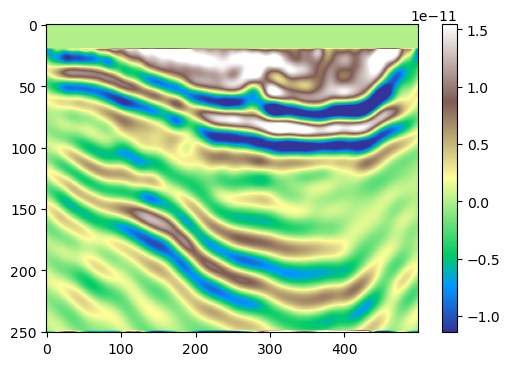

In [12]:
# Initialize the FWI class
fwi = fwi_lbfgs.FWI_LBFGS(data_true, wavel, params.s_cor, params.r_cor, params.dx, params.dt, 
                          params.num_batches, model.shape, msk, scaling=1., device=device)
# Perform the forward pass
fwi.forward(model_init.detach().cpu().numpy().ravel(), scipy=True)
# Compute the gradient
grad = fwi.grad(model_init.detach().cpu().numpy().ravel(), scipy=True)[-1]
# Compute the gradient scaling
fwi.scaling = (grad * msk.cpu().numpy().ravel()).max()
print(fwi.scaling)

In [13]:
# Create functions to run FWI with Scipy optimization
fun = lambda x: fwi.forward(x, scipy=True)
grad = lambda x: fwi.grad(x, scipy=True)[-1]
callback = lambda x: fwi.callback(x, model_true, error, res, nWE)

Func
Loss 362424.5717867703
Grad
3.14871913265069e-11
Func
Loss 362356.8753275416
Grad
3.14871913265069e-11
Func
Loss 362086.24745324394
Grad
3.14871913265069e-11
Func
Loss 361005.4554919721
Grad
3.14871913265069e-11
Func
Loss 356709.39222670987
Grad
3.14871913265069e-11
Func
Loss 339965.8675046678
Grad
3.14871913265069e-11
Func
Loss 280275.0178035197
Grad
3.14871913265069e-11
Func
Loss 280275.0178035197
Func
Loss 95256.24511796235
Grad
3.14871913265069e-11
Func
Loss 95256.24511796235
Func
Loss 67609.2962463494
Grad
3.14871913265069e-11
Func
Loss 67609.2962463494
Func
Loss 54377.12457307066
Grad
3.14871913265069e-11
Func
Loss 54377.12457307066
Func
Loss 45954.02125862137
Grad
3.14871913265069e-11
Func
Loss 45954.02125862137
Func
Loss 43218.6798763493
Grad
3.14871913265069e-11
Func
Loss 43218.6798763493
Func
Loss 41463.66312797055
Grad
3.14871913265069e-11
Func
Loss 41463.66312797055
Func
Loss 40523.57371645732
Grad
3.14871913265069e-11
Func
Loss 40523.57371645732
Func
Loss 39738.980505

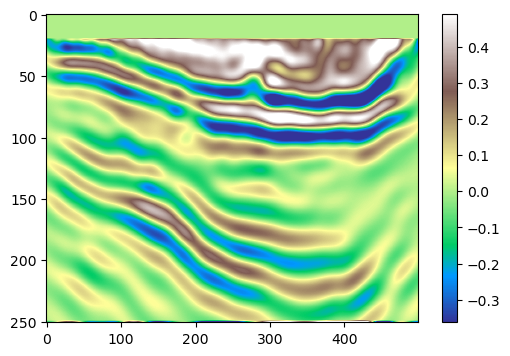

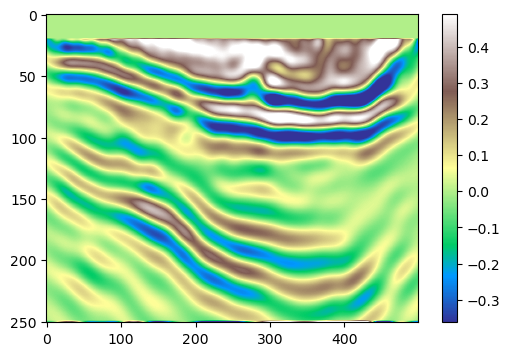

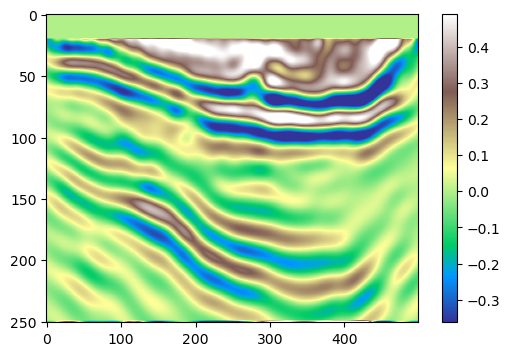

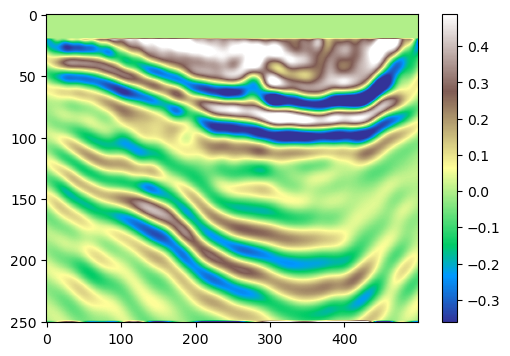

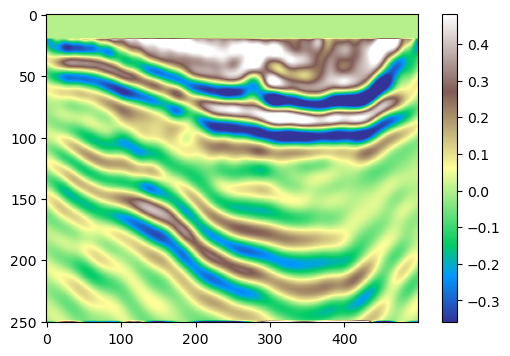

...

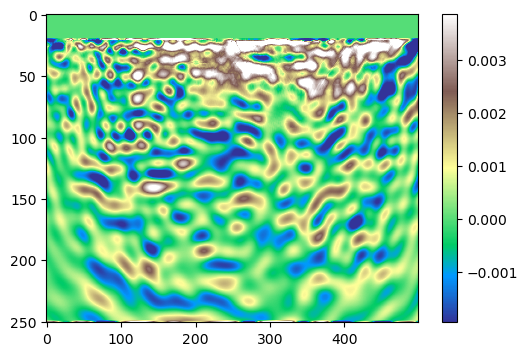

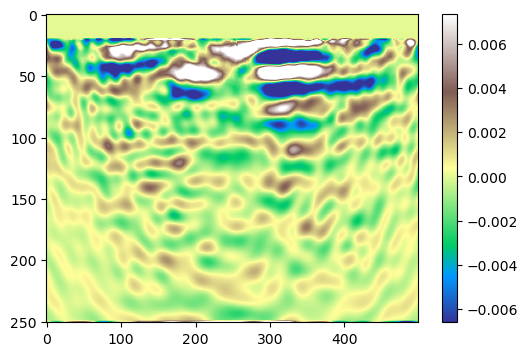

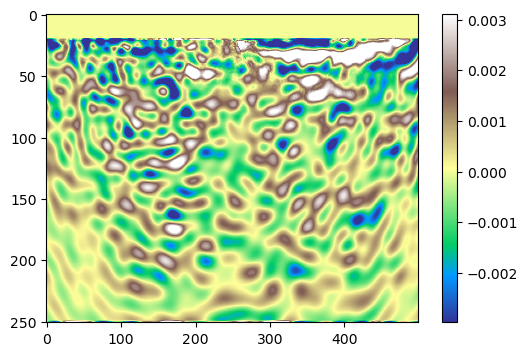

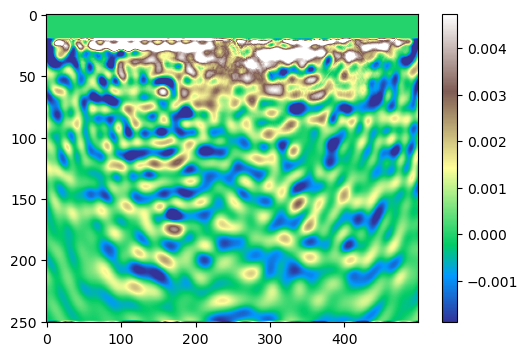

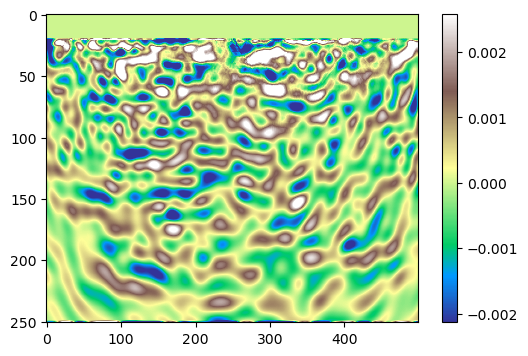

In [14]:
error, res, nWE = [], [], []
model0 = model_init.clone()
# Run FWI using Scipy L-BFGS
nl = minimize(fun, model0, jac=grad,
              method='L-BFGS-B', 
              callback=callback,
              options=dict(maxiter=50,),
             )
error = np.array(error)
nWE = np.array(nWE)
res = np.array(res)

Text(0.5, 0, 'WE soved')

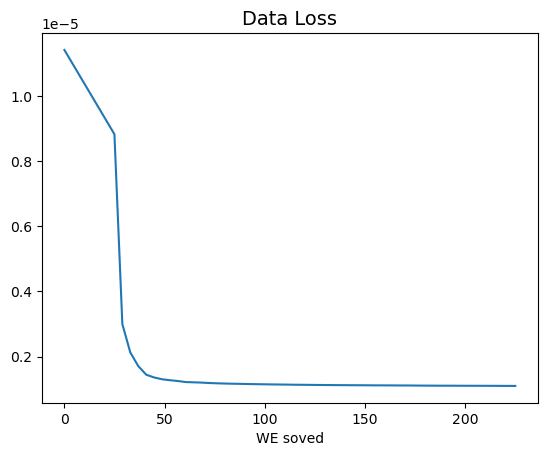

In [33]:
# Include the first data residual from the forward pass
first_res = 1.1411731833277372e-05
# Descale the data residual
data_res = res * fwi.scaling
data_res = np.concatenate([np.array([first_res]), data_res], axis=0)
# Plot the data loss per number of wave equation solved 
plt.plot(np.concatenate([[0], nWE/params.num_shots]), data_res)
plt.title('Data Loss', fontsize=14)
plt.xlabel('WE soved')

Text(0.5, 0, 'WE solved')

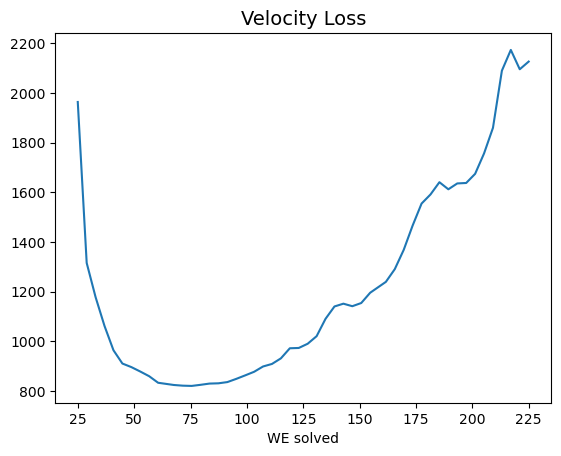

In [24]:
# Plot the velocity loss per number of wave equation solved 
plt.plot(nWE/params.num_shots, error)
plt.title('Velocity Loss', fontsize=14)
plt.xlabel('WE solved')

In [34]:
np.savez(f'{exp_name}/results', data_loss_lbfgs=np.array(data_res),
                               vel_loss_lbfgs=np.array(error),
                                nWE=np.array(nWE/params.num_shots))